from google.colab import files
files.upload()

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('seaborn-whitegrid')

import seaborn as sns


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_colwidth', -1)

import warnings
warnings.simplefilter('ignore')

In [ ]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

from lightgbm import LGBMClassifier

# **EDA**

Before going to any kind of modelling, we will always want to have a look at the kind of data that we have.  

We have been provided three files. A description for what each of these files contain is given below:


1.     **SampleSubmission.csv**: This gives us a required format for submitting our solutions to the AV solution checker.
2.     **Train.csv**: We will use this file for training our model. It contains variables or features that we will input to our model, and the *target variable* that we want to predict.
3.     **Test.csv**: This will contain all variables in the training dataset except the *target variable*. We will use our trained model to predict the target for this dataset. 


Now lets go on to read and have a look at each of the files.

In [3]:
ss = pd.read_csv('SampleSubmission_ZxsCq0O.csv')
train = pd.read_csv('Train_awoL0xl.csv')
test = pd.read_csv('Test_QQKW4dv.csv')

In [3]:
ss.head(10)

,ID,Close
0,id_713,85
1,id_714,85
2,id_715,85
3,id_716,85
4,id_717,85
5,id_718,85
6,id_719,85
7,id_720,85
8,id_721,85
9,id_722,85


Lets go and explore our training and test datasets. We will do the following steps:

1. Brief Look at the Dataset
2. See the dataset shape.
3. Target Distribution.
4. See the variables datatypes.
5. See the number of missing/null values.
6. See the number of unique values in each variable. 


#### **1. Brief look at the dataset**.

In [4]:
train.head(3)
test.head(3)

,ID,stock,Date,Open,High,Low,Close,holiday,unpredictability_score
0,id_0,0,2017-01-03,82.9961,82.7396,82.9144,82.8101,1,7
1,id_1,0,2017-01-04,83.1312,83.1669,83.3779,82.9690,0,7
2,id_2,0,2017-01-05,82.6622,82.7634,82.8984,82.8578,0,7


,ID,stock,Date,holiday,unpredictability_score
0,id_713,0,2019-11-01,0,7
1,id_714,0,2019-11-04,0,7
2,id_715,0,2019-11-05,0,7


In [46]:
ID_COL, TARGET_COL = 'id', 'Close'

#### **2. Dataset Shape (Number of Samples and Variables in the dataset)**

In [6]:
print(f'\nTrain contains {train.shape[0]} samples and {train.shape[1]} variables')
print(f'\nTest contains {test.shape[0]} samples and {test.shape[1]} variables')

features = [c for c in train.columns if c not in [ID_COL, TARGET_COL]]
print(f'\nThe dataset contains {len(features)} features')


Train contains 73439 samples and 9 variables

Test contains 4223 samples and 5 variables

The dataset contains 8 features


In [1]:
73439/103

713.0

#### 3. **Target Distribution**

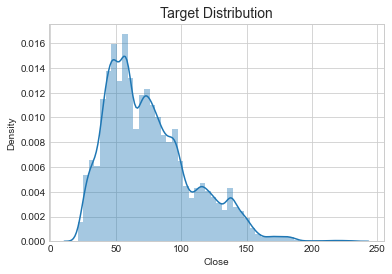

In [7]:
_ = sns.distplot(train[TARGET_COL])
_ = plt.title("Target Distribution", fontsize=14)

####**4. Variable Datatypes**

Lets have a look at the kind of data types that is being used to store the variables in pandas.

pandas info() method on dataframe allows to do that. For each variable we can see the number of non-null values along with their datatypes.



In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73439 entries, 0 to 73438
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      73439 non-null  object 
 1   stock                   73439 non-null  int64  
 2   Date                    73439 non-null  object 
 3   Open                    73439 non-null  float64
 4   High                    73439 non-null  float64
 5   Low                     73439 non-null  float64
 6   Close                   73439 non-null  float64
 7   holiday                 73439 non-null  int64  
 8   unpredictability_score  73439 non-null  int64  
dtypes: float64(4), int64(3), object(2)
memory usage: 5.0+ MB


#### **5. Null Values**

Although the info() function did tell us about non-null values ideally we want to have a look at the percentage of null values in each variable.

In [9]:
null_values_per_variable = 100 * (train.isnull().sum()/train.shape[0]).round(3)#.reset_index()
null_values_per_variable.sort_values(ascending=False)

unpredictability_score    0.0
holiday                   0.0
Close                     0.0
Low                       0.0
High                      0.0
Open                      0.0
Date                      0.0
stock                     0.0
ID                        0.0
dtype: float64

#### **6. Unique values in each variable**

In [10]:
train.nunique()

ID                        73439
stock                     103  
Date                      713  
Open                      60702
High                      60594
Low                       61015
Close                     60352
holiday                   2    
unpredictability_score    10   
dtype: int64

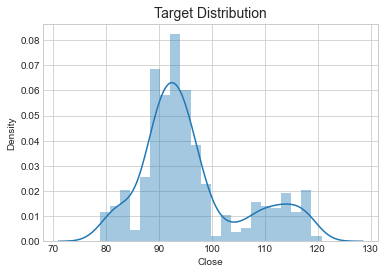

In [11]:
fltr = train['stock'] == 0
_ = sns.distplot(train[fltr][TARGET_COL])
_ = plt.title("Target Distribution", fontsize=14)

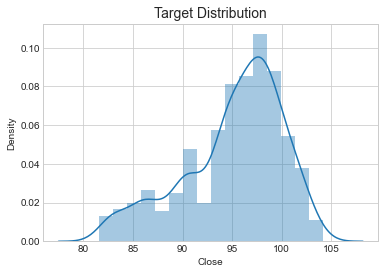

In [12]:
fltr = train['stock'] == 57
_ = sns.distplot(train[fltr][TARGET_COL])
_ = plt.title("Target Distribution", fontsize=14)

### **Time Series Plots**

In [13]:
plt.style.use('fivethirtyeight')

In [14]:
train['Date'] = pd.to_datetime(train['Date'])

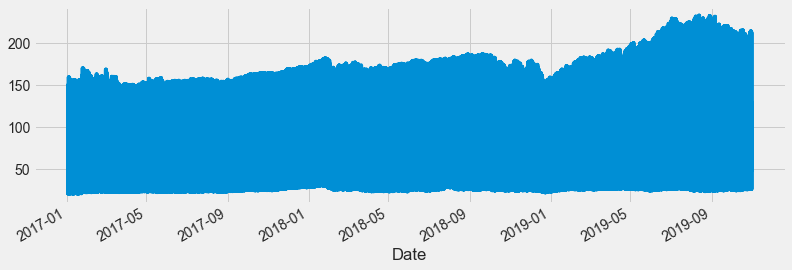

In [15]:
_ = train.set_index('Date')['Close'].plot(figsize=(12, 4))

## **Individual Time Series Plots**

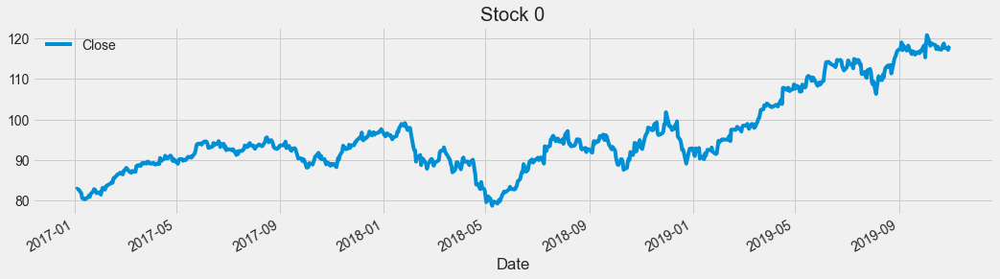

In [16]:
STOCK_NO = 0
fltr = train['stock'] == STOCK_NO
_ = train[fltr].set_index('Date')[['Close']].plot(figsize=(16, 4), title = f'Stock {STOCK_NO}')

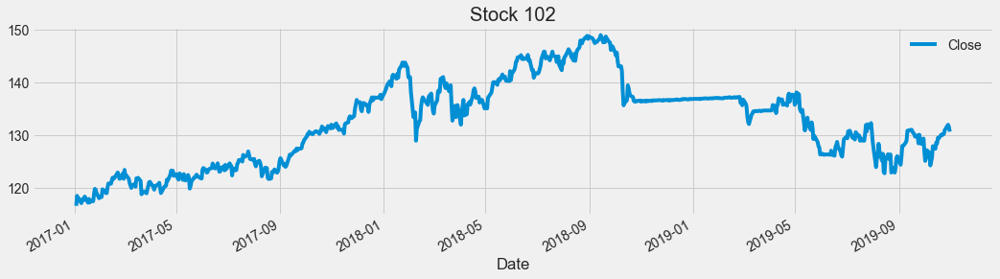

In [63]:
STOCK_NO = 102
fltr = train['stock'] == STOCK_NO
_ = train[fltr].set_index('Date')[['Close']].plot(figsize=(16, 4), title = f'Stock {STOCK_NO}')

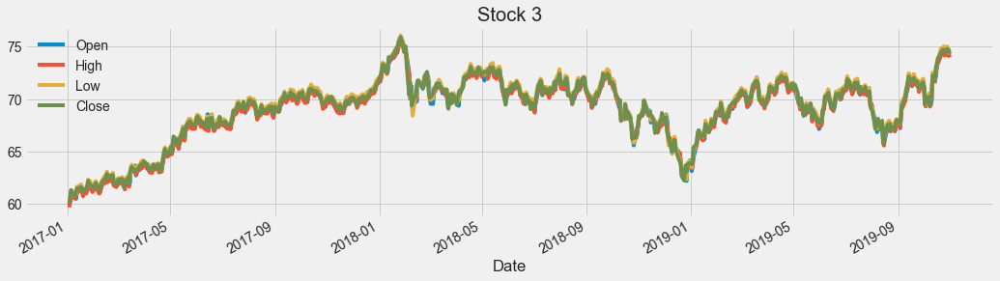

In [18]:
STOCK_NO = 3
fltr = train['stock'] == STOCK_NO
_ = train[fltr].set_index('Date')[['Open', 'High', 'Low', 'Close']].plot(figsize=(16, 4), title = f'Stock {STOCK_NO}')

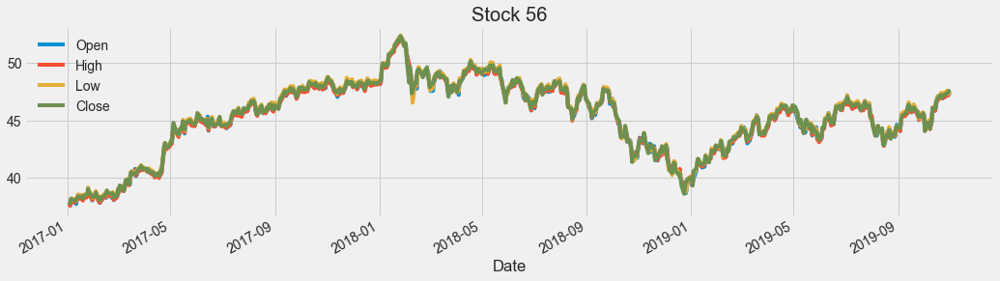

In [19]:
STOCK_NO = 56
fltr = train['stock'] == STOCK_NO
_ = train[fltr].set_index('Date')[['Open', 'High', 'Low', 'Close']].plot(figsize=(16, 4), title = f'Stock {STOCK_NO}')

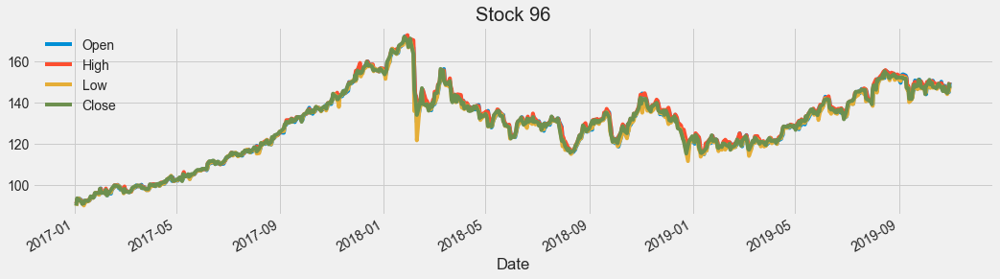

In [20]:
STOCK_NO = 96
fltr = train['stock'] == STOCK_NO
_ = train[fltr].set_index('Date')[['Open', 'High', 'Low', 'Close']].plot(figsize=(16, 4), title = f'Stock {STOCK_NO}')

In [21]:
from sklearn.metrics import mean_squared_error
def rmse(y_true, y_pred):
  return mean_squared_error(y_true, y_pred) ** 0.5

## **Baseline Model - A**

In [44]:
def download_preds(preds_test, file_name = 'hacklive_sub.csv'):

  ## 1. Setting the target column with our obtained predictions
  ss[TARGET_COL] = preds_test

  ## 2. Saving our predictions to a csv file

  ss.to_csv(file_name, index = False)

  ## 3. Downloading and submitting the csv file
  #from google.colab import files
  #files.download(file_name)

### Using the median value




In [23]:
mapper = train.groupby('stock')['Close'].median()


In [24]:
mapper

stock
0      93.4646 
1      40.8152 
2      139.1312
3      69.8034 
4      75.7312 
        ...    
98     123.3825
99     48.3986 
100    58.0797 
101    117.4639
102    133.4951
Name: Close, Length: 103, dtype: float64

In [25]:
preds = train['stock'].map(mapper)

In [26]:
rmse(train['Close'], preds)

9.813999354116822

In [27]:
preds_test = test[['ID', 'stock']].copy()
preds_test['Close'] = preds_test['stock'].map(mapper)
download_preds(preds_test['Close'])

In [28]:
train['Date']

0       2017-01-03
1       2017-01-04
2       2017-01-05
3       2017-01-06
4       2017-01-09
           ...    
73434   2019-10-25
73435   2019-10-28
73436   2019-10-29
73437   2019-10-30
73438   2019-10-31
Name: Date, Length: 73439, dtype: datetime64[ns]

### LightGBM Model

In [4]:
df = pd.concat([train, test], axis=0).reset_index(drop = True)

In [5]:
df['Date'] = pd.to_datetime(df["Date"])

In [31]:
for attr in ['year', 'month', 'day', 'week', 'dayofweek']:
  df[attr] = getattr(df['Date'].dt, attr)

In [32]:
features = ['holiday','unpredictability_score', 'year', 'month', 'day', 'week', 'dayofweek']

In [6]:
train, test = df[:train.shape[0]].reset_index(drop = True), df[train.shape[0]:].reset_index(drop = True)

In [34]:
LAST_TRAINING_DAY = train['Date'].max()
DAYS_TO_VALIDATE = pd.Timedelta(days = 60)
VAL_FIRST_DAY = LAST_TRAINING_DAY - DAYS_TO_VALIDATE
LAST_TRAINING_DAY - VAL_FIRST_DAY

Timedelta('60 days 00:00:00')

In [35]:
val_fltr = train['Date'] >= VAL_FIRST_DAY
trn, val = train[~val_fltr].reset_index(drop = True), train[val_fltr].reset_index(drop = True)

In [36]:
features = ['stock', 'holiday', 'unpredictability_score', 'year', 'month', 'day', 'week', 'dayofweek']

In [37]:
from lightgbm import LGBMRegressor

In [38]:
import optuna.integration.lightgbm as lgb
import sklearn.datasets

"lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),

In [51]:
dtrain = lgb.Dataset(trn[features], trn['Close'])
dval = lgb.Dataset(val[features], val[TARGET_COL])
params = {
        "objective": "regression_l1",
        "metric": "mape",
        "verbosity": -1,
        "boosting_type": "gbdt",        
        }

model = lgb.train(
        params, dtrain, valid_sets=[dtrain, dval], verbose_eval=100, early_stopping_rounds=100
    )
prediction = np.rint(model.predict(val[features], num_iteration=model.best_iteration))
#accuracy = accuracy_score(val[TARGET_COL], prediction)

best_params = model.params
print("Best params:", best_params)
#print("  Accuracy = {}".format(accuracy))
print("  Params: ")
for key, value in best_params.items():
    print("    {}: {}".format(key, value))
#params = { 'nthread': 10, 'max_depth': 5, 'learning_rate': 0.2,          'min_child_weight': 6.996211413900573,        'min_split_gain': 0.037310344962162616,        }

120:   5%|5         | 1/20 [00:18<05:57, 18.80s/it]Training until validation scores don't improve for 100 rounds
[100]	valid_0's mape: 0.0164881	valid_1's mape: 0.0474132
[200]	valid_0's mape: 0.0115787	valid_1's mape: 0.0451903
[300]	valid_0's mape: 0.00958238	valid_1's mape: 0.0446113
Early stopping, best iteration is:
[269]	valid_0's mape: 0.00997619	valid_1's mape: 0.0445884
regularization_factors, val_score: 0.044120:  10%|#         | 2/20 [00:28<04:48, 16.05s/it]Training until validation scores don't improve for 100 rounds
[100]	valid_0's mape: 0.0164881	valid_1's mape: 0.0474132
[200]	valid_0's mape: 0.0115787	valid_1's mape: 0.0451903
[300]	valid_0's mape: 0.00958238	valid_1's mape: 0.0446113
Early stopping, best iteration is:
[269]	valid_0's mape: 0.00997619	valid_1's mape: 0.0445884
regularization_factors, val_score: 0.044120:  15%|#5        | 3/20 [00:37<03:57, 13.97s/it]Training until validation scores don't improve for 100 rounds
[100]	valid_0's mape: 0.0171041	valid_1's m

In [52]:
import lightgbm as lgb

In [54]:
params = {'objective': 'regression_l1', 'metric': 'mape', 'verbosity': -1, 'boosting_type': 'gbdt', 'feature_pre_filter': False, 'lambda_l1': 0.00038333483412629233, 'lambda_l2': 0.002890210224114304, 'num_leaves': 202, 'feature_fraction': 0.92, 'bagging_fraction': 1.0, 'bagging_freq': 0, 'min_child_samples': 20, 'num_iterations': 1000, 'early_stopping_round': 100}
clf = lgb.train(
        params, dtrain, valid_sets=[dval], verbose_eval=100, early_stopping_rounds=100
    )
clf.save_model('model.txt')

Training until validation scores don't improve for 100 rounds
[100]	valid_0's mape: 0.0471588
[200]	valid_0's mape: 0.0441101
[300]	valid_0's mape: 0.0432136
[400]	valid_0's mape: 0.0435206
Early stopping, best iteration is:
[314]	valid_0's mape: 0.0432104


clf = LGBMRegressor(n_estimators=10000)
clf.fit(trn[features], trn['Close'], eval_set = [(val[features], val[TARGET_COL])], verbose = 50, early_stopping_rounds=200, eval_metric='mape')


In [56]:
pt = clf.predict(test[features],num_iteration=clf.best_iteration)
download_preds(pt, 'lightgbm_simple.csv')

In [57]:
pd.read_csv('lightgbm_simple.csv')

,ID,Close
0,id_713,109.083236
1,id_714,109.916320
2,id_715,110.319718
3,id_716,110.889496
4,id_717,111.515504
...,...,...
4218,id_77657,128.841097
4219,id_77658,130.487154
4220,id_77659,130.132977
4221,id_77660,133.991666


In [58]:
preds_test_df = test.copy()
preds_test_df['Close'] = pt

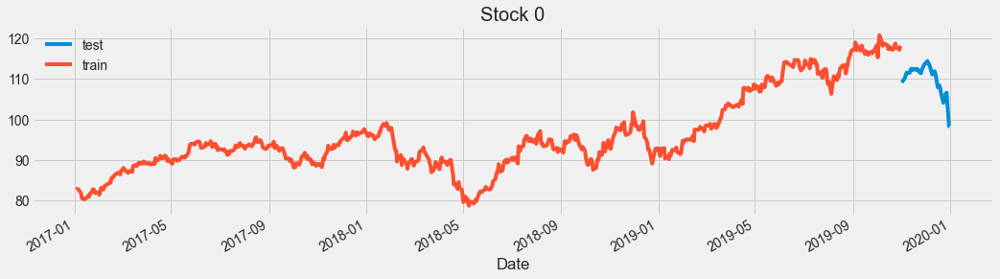

In [59]:
STOCK_NO = 0
train_fltr = train['stock'] == STOCK_NO
train_tmp = train[train_fltr].set_index('Date')[['Close']]
train_tmp['type'] = 'train'
test_fltr = preds_test_df['stock'] == STOCK_NO
test_tmp = preds_test_df[test_fltr].set_index('Date')[['Close']]
test_tmp['type'] = 'test'
_ = train_tmp.append(test_tmp).groupby('type')['Close'].plot(figsize=(16, 4), title = f'Stock {STOCK_NO}', sharex=False)
_ = plt.legend()

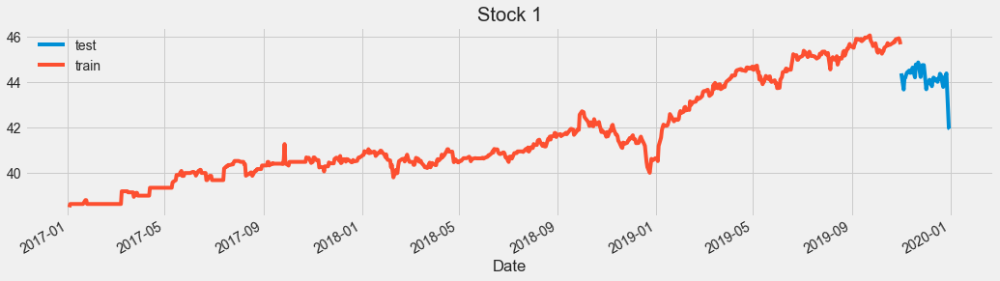

In [44]:
STOCK_NO = 1
train_fltr = train['stock'] == STOCK_NO
train_tmp = train[train_fltr].set_index('Date')[['Close']]
train_tmp['type'] = 'train'
test_fltr = preds_test_df['stock'] == STOCK_NO
test_tmp = preds_test_df[test_fltr].set_index('Date')[['Close']]
test_tmp['type'] = 'test'
_ = train_tmp.append(test_tmp).groupby('type')['Close'].plot(figsize=(16, 4), title = f'Stock {STOCK_NO}', sharex=False)
_ = plt.legend()

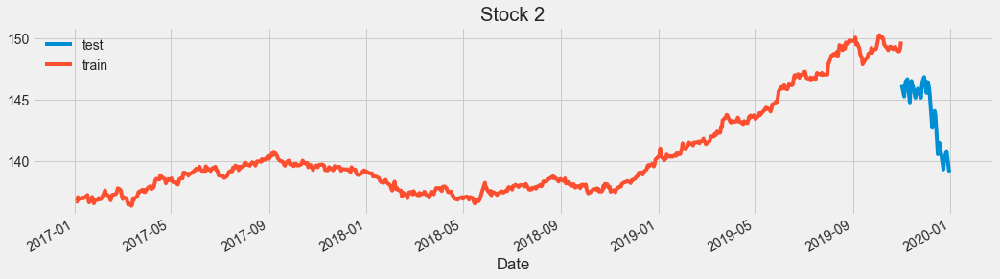

In [60]:
STOCK_NO = 2
train_fltr = train['stock'] == STOCK_NO
train_tmp = train[train_fltr].set_index('Date')[['Close']]
train_tmp['type'] = 'train'
test_fltr = preds_test_df['stock'] == STOCK_NO
test_tmp = preds_test_df[test_fltr].set_index('Date')[['Close']]
test_tmp['type'] = 'test'
_ = train_tmp.append(test_tmp).groupby('type')['Close'].plot(figsize=(16, 4), title = f'Stock {STOCK_NO}', sharex=False)
_ = plt.legend()

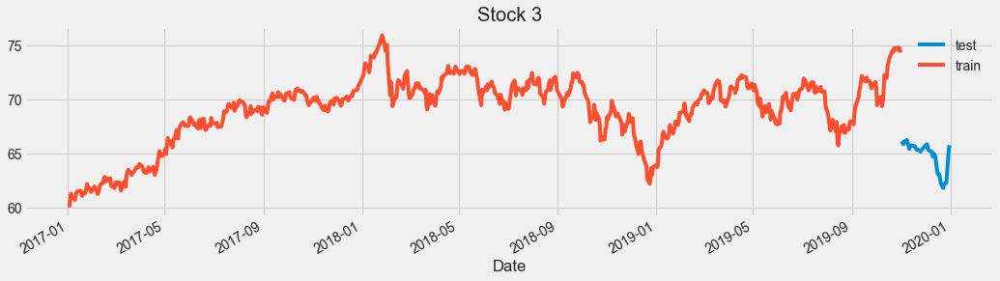

In [46]:
STOCK_NO = 3
train_fltr = train['stock'] == STOCK_NO
train_tmp = train[train_fltr].set_index('Date')[['Close']]
train_tmp['type'] = 'train'
test_fltr = preds_test_df['stock'] == STOCK_NO
test_tmp = preds_test_df[test_fltr].set_index('Date')[['Close']]
test_tmp['type'] = 'test'
_ = train_tmp.append(test_tmp).groupby('type')['Close'].plot(figsize=(16, 4), title = f'Stock {STOCK_NO}', sharex=False)
_ = plt.legend()

Ideas you can Try:

1. Use more features in LightGBM. done 14/11/2020
2. Use traditional algorithms like ARIMA.
3. Use FBPROPHET.
4. Use Deep Learning.
5. Any other SOTA models 
6. try pytorch forcasting .?

FBPROPHET FORECASTING MODEL

In [35]:
from fbprophet import Prophet
from tqdm import tqdm
ss = pd.read_csv('SampleSubmission_ZxsCq0O.csv')
train = pd.read_csv('Train_awoL0xl.csv')
test = pd.read_csv('Test_QQKW4dv.csv')

In [36]:
df = pd.concat([train, test], axis=0).reset_index(drop = True)
df['Date'] = pd.to_datetime(df["Date"])
df = df.rename(columns={'Date':'ds','Close':'y'})
train, test = df[:train.shape[0]].reset_index(drop = True), df[train.shape[0]:].reset_index(drop = True)
preds = pd.Series()
STOCK_NO = 103

In [39]:
def run_prophet(train,test,i,preds):
    dfx = train[train['stock']== (i)]
    dfy = test[test['stock']== (i)]
    holiday = dfx[dfx['holiday']==1]
    holiday['holiday']= 'holi'
    holiday = holiday[['holiday','ds']]
    #model = Prophet(changepoint_range=0.90,changepoint_prior_scale=0.1,holidays=holiday)
    model = Prophet(changepoint_range=0.90,changepoint_prior_scale=0.2,seasonality_prior_scale = 0.01,   
    seasonality_mode ='multiplicative', holidays_prior_scale = 1, holidays=holiday)
    #changepoint_prior_scale 0.02 changepoint_prior_scale   0.2 seasonality_prior_scale  0.01   holidays_prior_scale                    1 seasonality_mode           multiplicative
    model.add_regressor('unpredictability_score', mode= 'multiplicative')
    model.fit(dfx)
#future = model.make_future_dataframe(periods=61, include_history=False)
    forecast = model.predict(dfy)
    preds = preds.append(forecast['yhat'])
    model.plot(forecast)
    return preds,forecast

100%|██████████| 103/103 [26:58<00:00, 15.72s/it]


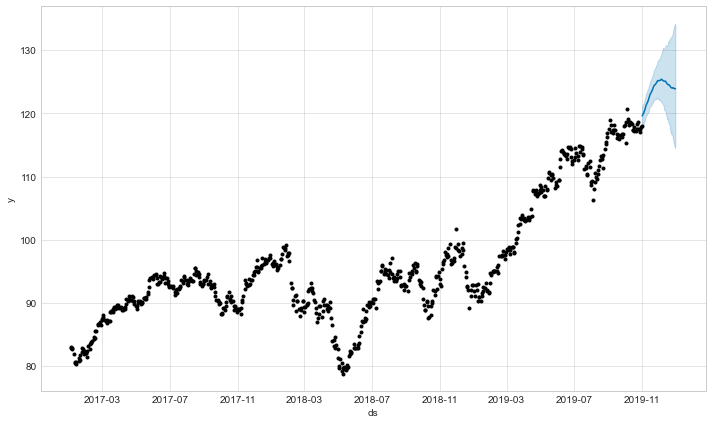

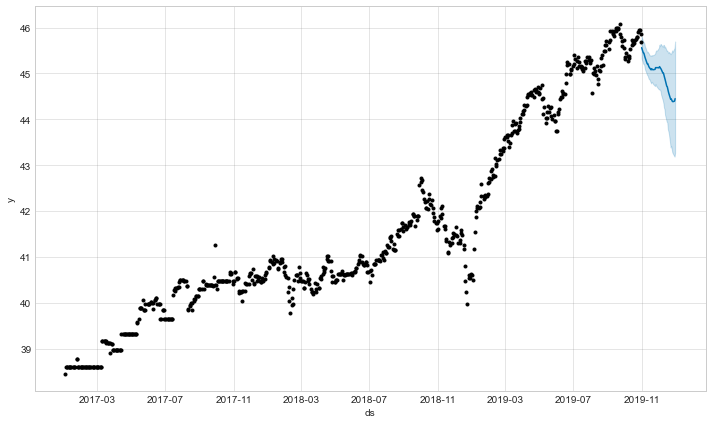

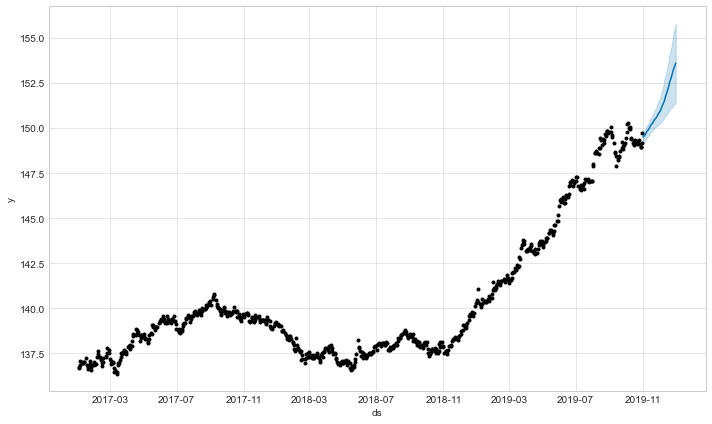

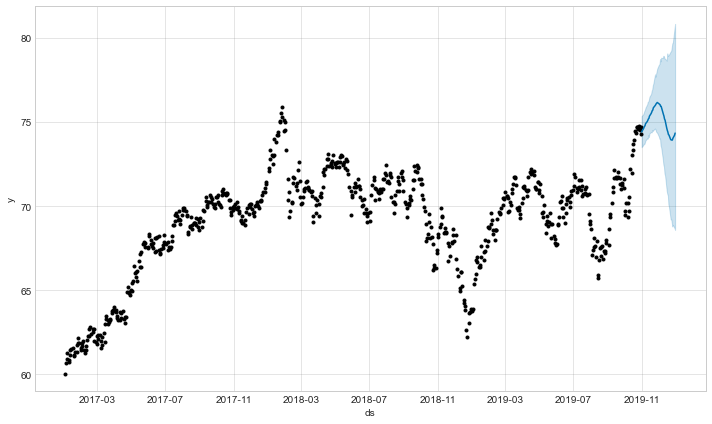

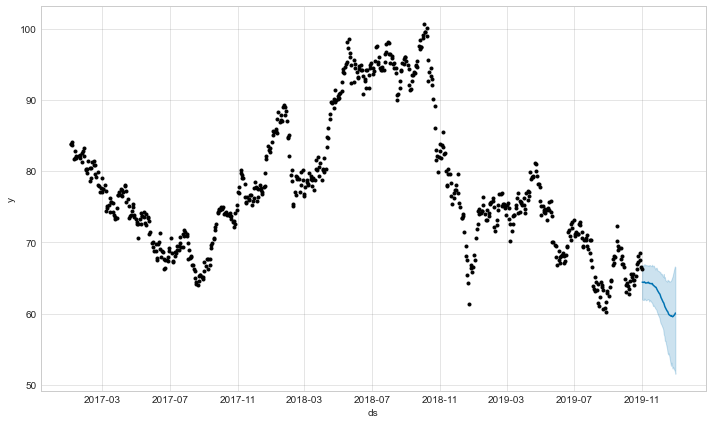

...

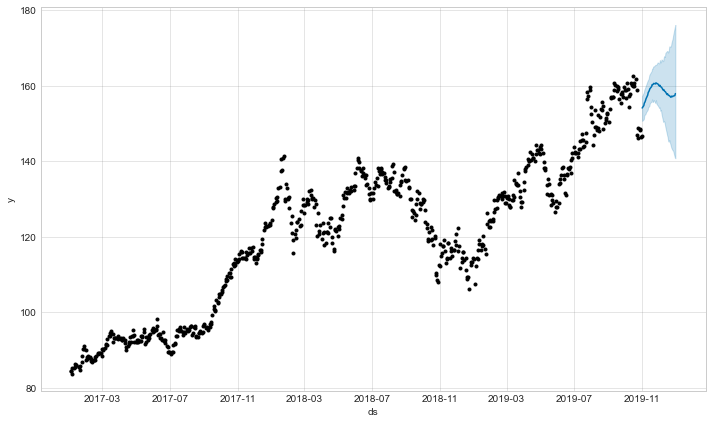

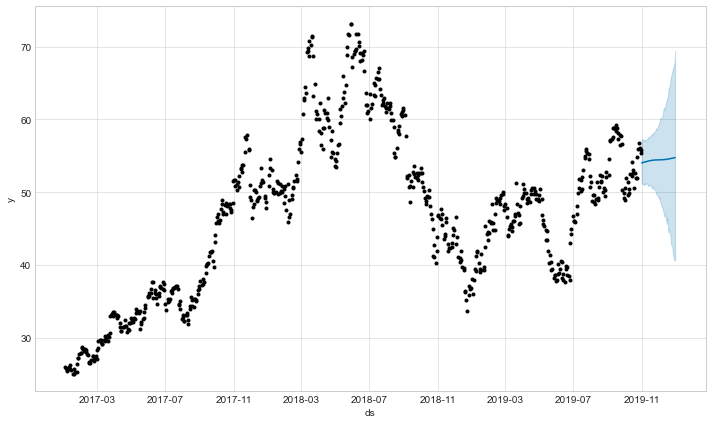

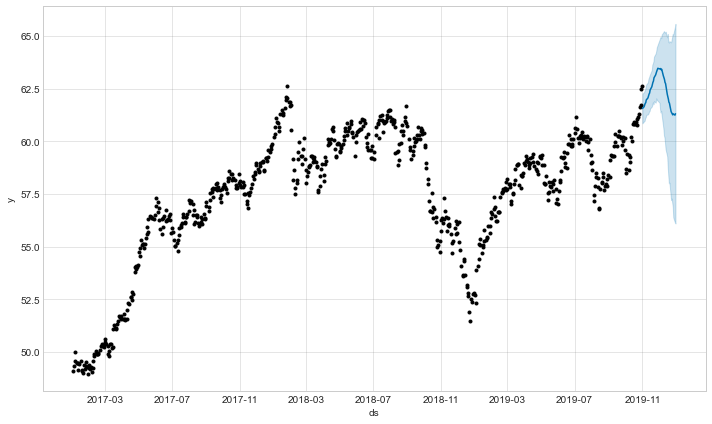

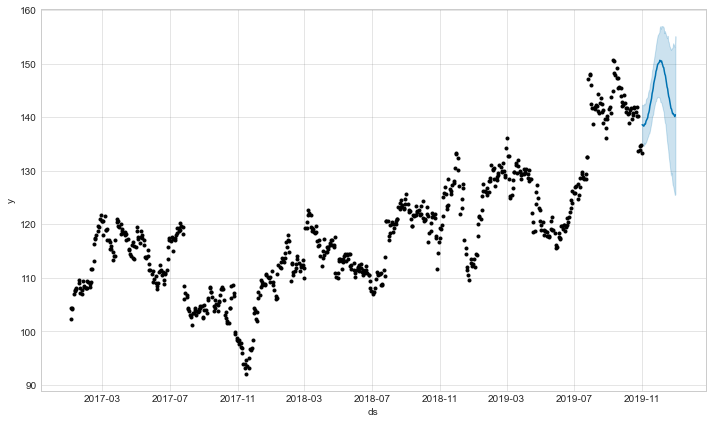

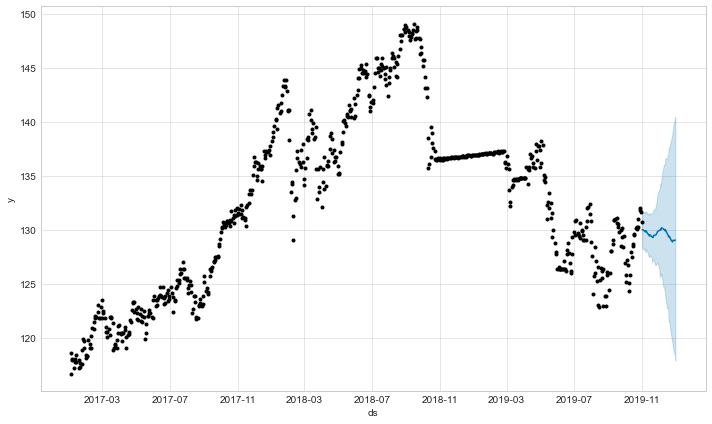

In [40]:
for i in tqdm(range(STOCK_NO)):
    preds,forecast = run_prophet(train,test,i,preds)


In [7]:
fig = model.plot_components(forecast)

NameError: name 'model' is not defined

In [47]:
pt=preds.tolist()
download_preds(pt, 'fbprophet_simple.csv')

In [48]:
#download_preds(preds, 'fbprophet.csv')
a=pd.read_csv('fbprophet_simple.csv')
a


,ID,Close
0,id_713,119.599781
1,id_714,120.104569
2,id_715,120.348306
3,id_716,120.600224
4,id_717,120.905649
...,...,...
4218,id_77657,128.994852
4219,id_77658,128.879743
4220,id_77659,129.032058
4221,id_77660,129.003501


Cross validation of fb prophet

In [26]:
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('seaborn-whitegrid')
import seaborn as sns
from fbprophet import Prophet
from tqdm import tqdm
from fbprophet.diagnostics import cross_validation,performance_metrics
from fbprophet.plot import plot_cross_validation_metric

In [27]:
ss = pd.read_csv('SampleSubmission_ZxsCq0O.csv')
train = pd.read_csv('Train_awoL0xl.csv')
test = pd.read_csv('Test_QQKW4dv.csv')

df = pd.concat([train, test], axis=0).reset_index(drop = True)
df['Date'] = pd.to_datetime(df["Date"])
df = df.rename(columns={'Date':'ds','Close':'y'})
train, test = df[:train.shape[0]].reset_index(drop = True), df[train.shape[0]:].reset_index(drop = True)
preds = pd.Series()
STOCK_NO = 33

dfx = train[train['stock']== (STOCK_NO)]
dfy = test[test['stock']== (STOCK_NO)]
holiday = dfx[dfx['holiday']==1]
holiday['holiday']= 'holi'

In [28]:
initial = 365.25
initial = str(initial) + ' days'
# Fold every 5 years
period = 365.25
period = str(period) + ' days'
# Forecast 1 year into the future
horizon = 41
horizon = str(horizon) + ' days'
param_grid = {  
    'changepoint_prior_scale': [ 0.01, 0.05,0.1, 0.2],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'holidays_prior_scale' : [0.1, 1.0, 5.0, 10.0] ,
    'seasonality_mode':  ['additive', 'multiplicative']
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params,changepoint_range=0.90,holidays=holiday)
    m.add_regressor('unpredictability_score', mode= 'multiplicative')
    m.fit(dfx)  # Fit model with given params
    df_cv = cross_validation(m, initial=initial, period=period, horizon = horizon, parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 2 forecasts with cutoffs between 2018-09-19 18:00:00 and 2019-09-20 00:00:00
INFO:fbprophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x000001FF6C0CD190>
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 2 forecasts with cutoffs between 2018-09-19 18:00:00 and 2019-09-20 00:00:00
INFO:fbprophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x000001FF6C0CD670>
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 2 forecasts with cutoffs between 2018-09-19 18:00:00 and 2019-09-20 00:00:00
INFO:fbprophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x000001FF6C27A100>
INFO:fbprophet:Disabling daily seasonali

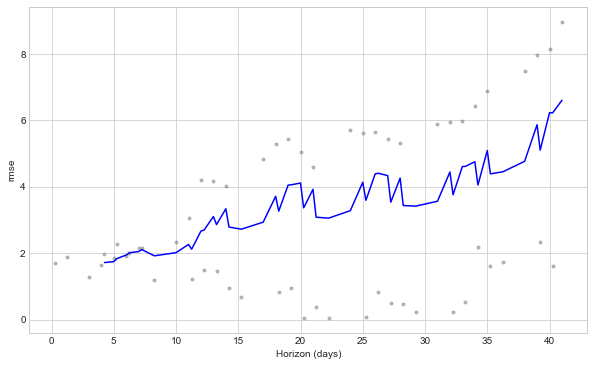

In [29]:
plot_cross_validation_metric(df_cv, metric='rmse');

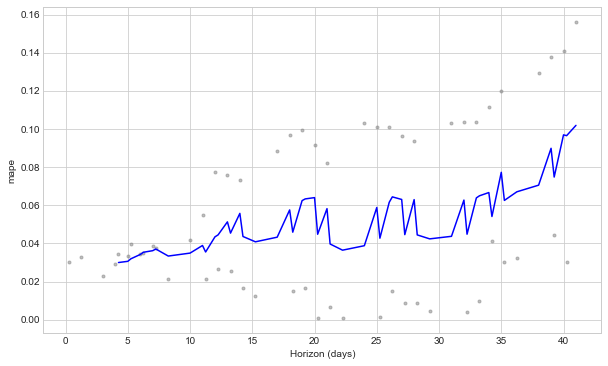

In [30]:
plot_cross_validation_metric(df_cv, metric='mape');

In [31]:
from IPython.display import display
with pd.option_context('display.max_rows', 128):
    display(tuning_results.head(128))

,changepoint_prior_scale,seasonality_prior_scale,holidays_prior_scale,seasonality_mode,rmse
0,0.01,0.01,0.1,additive,2.706316
1,0.01,0.01,0.1,multiplicative,2.422489
2,0.01,0.01,1.0,additive,2.958001
3,0.01,0.01,1.0,multiplicative,2.614114
4,0.01,0.01,5.0,additive,3.016522
5,0.01,0.01,5.0,multiplicative,2.549968
6,0.01,0.01,10.0,additive,3.052989
7,0.01,0.01,10.0,multiplicative,2.538598
8,0.01,0.10,0.1,additive,2.672782
9,0.01,0.10,0.1,multiplicative,2.526435


In [33]:
value =tuning_results['rmse'].min()
value

1.2795703390172988

In [34]:
min = tuning_results.iloc[99]
min

changepoint_prior_scale               0.2
seasonality_prior_scale              0.01
holidays_prior_scale                    1
seasonality_mode           multiplicative
rmse                              1.27957
Name: 99, dtype: object

In [12]:
print(tuning_results)

     changepoint_prior_scale  seasonality_prior_scale  holidays_prior_scale  \
0                      0.001                     0.01                   0.1   
1                      0.001                     0.01                   0.1   
2                      0.001                     0.01                   1.0   
3                      0.001                     0.01                   1.0   
4                      0.001                     0.01                   5.0   
..                       ...                      ...                   ...   
123                    0.500                    10.00                   1.0   
124                    0.500                    10.00                   5.0   
125                    0.500                    10.00                   5.0   
126                    0.500                    10.00                  10.0   
127                    0.500                    10.00                  10.0   

    seasonality_mode      rmse  
0           additi

0.4722222222222222